# Ambiguity Drives Higher-Order Pavlovian Learning

### Zbozinek TD, Perez OD, Wise T, Fanselow M, & Mobbs D

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from theano import scan
import theano.tensor as T
import pymc3 as pm
import theano
import seaborn as sns
import os, sys, subprocess
import pickle

WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


# Load Data

In [2]:
data = pd.read_csv(os.path.join('../data/', "2nd_POS_Modeling_Data_OS2.csv"))

In [3]:
data['DV'] = ((data['DV'].values - 1) / 2) - 1

observed_R = data.pivot(columns = 'ID', index = 'trialseq', values = 'DV').values[:, np.newaxis, :] #values.T transposes the data, so you can make trials the first dimension or participants first

# Occasion Setting Model

In [4]:
def learning_function(stimuli_shown, Λ, λ, training_or_test, prev_V, prev_Vbar, prev_P, prev_N, prev_P2, prev_N2, prev_Phat, prev_Nhat, prev_Phat2, prev_Nhat2, stimulus_type, OS1_type, OS2_type, α, 
                      iotaP, iotaPabs, iotaN, iotaP2, iotaN2abs):
    
    Λbar = T.zeros_like(Λ)
    Λbar = T.inc_subtensor(Λbar[0,:], (prev_V[5,:] > 0) * (1 - Λ[0, :]))    #Dcs
    Λbar = T.inc_subtensor(Λbar[1,:], (prev_V[3,:] > 0) * (1 - Λ[3, :]))    #D1
    Λbar = T.inc_subtensor(Λbar[2,:], (prev_V[5,:] > 0) * (1 - Λ[2, :]))    #D2
    Λbar = T.inc_subtensor(Λbar[3,:], (prev_V[3,:] > 0) * (1 - Λ[3, :]))    #Ecs
    Λbar = T.inc_subtensor(Λbar[4,:], (prev_V[5,:] > 0) * (1 - Λ[5, :]))    #E1
    Λbar = T.inc_subtensor(Λbar[5,:], (prev_V[5,:] > 0) * (1 - Λ[5, :]))    #F
    Λbar = T.inc_subtensor(Λbar[6,:], (prev_V[5,:] > 0) * (1 - Λ[7, :]))    #S
    Λbar = T.inc_subtensor(Λbar[7,:], (prev_V[7,:] > 0) * (1 - Λ[7, :]))    #G
    Λbar = T.inc_subtensor(Λbar[8,:], (prev_V[7,:] > 0) * (1 - Λ[7, :]))    #H
    Λbar = T.inc_subtensor(Λbar[9,:], (prev_V[9,:] > 0) * (1 - Λ[9, :]))    #Mcs
    Λbar = T.inc_subtensor(Λbar[10,:], (prev_V[11,:] > 0) * (1 - Λ[11, :])) #M1
    Λbar = T.inc_subtensor(Λbar[11,:], (prev_V[11,:] > 0) * (1 - Λ[11, :])) #N
    Λbar = T.inc_subtensor(Λbar[12,:], (prev_V[11,:] > 0) * (1 - Λ[12, :])) #Ucs
    Λbar = T.inc_subtensor(Λbar[13,:], (prev_V[9,:] > 0) * (1 - Λ[9, :]))   #U1
    Λbar = T.inc_subtensor(Λbar[14,:], (prev_V[11,:] > 0) * (1 - Λ[11, :])) #U2
    Λbar = T.inc_subtensor(Λbar[15,:], (prev_V[3,:] > 0) * (1 - Λ[3, :]))   #D1_abs
    Λbar = T.inc_subtensor(Λbar[16,:], (prev_V[5,:] > 0) * (1 - Λ[5, :]))   #D2_abs
    Λbar = T.inc_subtensor(Λbar[17,:], (prev_V[5,:] > 0) * (1 - Λ[5, :]))   #E1_abs
    Λbar = T.inc_subtensor(Λbar[18,:], (prev_V[11,:] > 0) * (1 - Λ[11, :])) #M1_abs
    Λbar = T.inc_subtensor(Λbar[19,:], (prev_V[9,:] > 0) * (1 - Λ[10, :]))  #U1_abs
    Λbar = T.inc_subtensor(Λbar[20,:], (prev_V[11,:] > 0) * (1 - Λ[11, :])) #U2_abs
    
    
    #λbar Scaling
    λbar = T.zeros_like(Λbar)
    λbar = T.inc_subtensor(λbar[0,:], prev_V[5,:])    #Dcs
    λbar = T.inc_subtensor(λbar[1,:], prev_V[3,:])    #D1
    λbar = T.inc_subtensor(λbar[2,:], prev_V[5,:])    #D2
    λbar = T.inc_subtensor(λbar[3,:], prev_V[3,:])    #Ecs
    λbar = T.inc_subtensor(λbar[4,:], prev_V[5,:])    #E1
    λbar = T.inc_subtensor(λbar[5,:], prev_V[5,:])    #F
    λbar = T.inc_subtensor(λbar[6,:], prev_V[5,:])    #S
    λbar = T.inc_subtensor(λbar[7,:], prev_V[7,:])    #G
    λbar = T.inc_subtensor(λbar[8,:], prev_V[7,:])    #H
    λbar = T.inc_subtensor(λbar[9,:], prev_V[9,:])    #Mcs
    λbar = T.inc_subtensor(λbar[10,:], prev_V[11,:])  #M1
    λbar = T.inc_subtensor(λbar[11,:], prev_V[11,:])  #N
    λbar = T.inc_subtensor(λbar[12,:], prev_V[11,:])  #Ucs
    λbar = T.inc_subtensor(λbar[13,:], prev_V[9,:])   #U1
    λbar = T.inc_subtensor(λbar[14,:], prev_V[11,:])  #U2
    λbar = T.inc_subtensor(λbar[15,:], prev_V[3,:])   #D1_abs
    λbar = T.inc_subtensor(λbar[16,:], prev_V[5,:])   #D2_abs
    λbar = T.inc_subtensor(λbar[17,:], prev_V[5,:])   #E1_abs
    λbar = T.inc_subtensor(λbar[18,:], prev_V[11,:])  #M1_abs
    λbar = T.inc_subtensor(λbar[19,:], prev_V[9,:])   #U1_abs
    λbar = T.inc_subtensor(λbar[20,:], prev_V[11,:])  #U2_abs


    pe_V = λ - prev_V
    pe_Vbar = λbar - prev_Vbar
    pe_P = λ - prev_P
    pe_N = λbar - prev_N
    pe_P2 = λ - prev_P2
    pe_N2 = λbar - prev_N2
    pe_Phat = λ - prev_Phat
    pe_Nhat = λbar - prev_Nhat
    pe_Phat2 = λ - prev_Phat2
    pe_Nhat2 = λbar - prev_Nhat2

    #Iotas
    iotaP     = iotaP       *(stimuli_shown[[1,4,10,13  ],:].sum(axis=0) > 0)
    iotaPabs  = iotaPabs    *(stimuli_shown[[15,17,18,19],:].sum(axis=0) > 0)
    iotaN     = iotaN       *(stimuli_shown[[1,4,10,13  ],:].sum(axis=0) > 0)  
    iotaP2    = iotaP2      *(stimuli_shown[[2,14],:].sum(axis=0) > 0)
    iotaN2abs = iotaN2abs   *(stimuli_shown[[16,20],:].sum(axis=0) > 0)
    
    
    #γ
    prev_γ1 = prev_V * prev_Vbar
    prev_γ2 = prev_P * prev_N


    CS_prev_γ1 = (prev_γ1 * stimuli_shown).sum(axis=0)
    CS_prev_γ2 = (prev_γ2 * stimuli_shown).sum(axis=0)
    ΔV = Λ * (α) * pe_V
    ΔVbar = Λbar * (α) * pe_Vbar
    ΔP = Λ * (α) * CS_prev_γ1 * pe_P
    ΔN = Λbar * (α) * CS_prev_γ1 * pe_N
    ΔP2 = Λ * (α) * CS_prev_γ2 * pe_P2
    ΔN2 = Λbar * (α) * CS_prev_γ2 * pe_N2
    
    ΔPhat = Λ *     (α) * CS_prev_γ1 * pe_Phat
    ΔNhat = Λbar *  (α) * CS_prev_γ1 * pe_Nhat
    ΔPhat2 = Λ *    (α) * CS_prev_γ2 * pe_Phat2
    ΔNhat2 = Λbar * (α) * CS_prev_γ2 * pe_Nhat2


    # Only update stimuli that were shown
    ΔV = ΔV * stimuli_shown
    ΔVbar = ΔVbar * stimuli_shown
    ΔP = ΔP * stimuli_shown
    ΔN = ΔN * stimuli_shown
    ΔP2 = ΔP2 * stimuli_shown
    ΔN2 = ΔN2 * stimuli_shown
    
    ΔPhat = ΔPhat * stimuli_shown
    ΔNhat = ΔNhat * stimuli_shown
    ΔPhat2 = ΔPhat2 * stimuli_shown
    ΔNhat2 = ΔNhat2 * stimuli_shown
    
    # Update V, Vbar, P, N, P2, N2, "hats"
    V = T.zeros_like(prev_V)
    Vbar = T.zeros_like(prev_Vbar)
    P = T.zeros_like(prev_P)
    N = T.zeros_like(prev_N)
    P2 = T.zeros_like(prev_P2)
    N2 = T.zeros_like(prev_N2)
    
    Phat = T.zeros_like(prev_Phat)
    Nhat = T.zeros_like(prev_Nhat)
    Phat2 = T.zeros_like(prev_Phat2)
    Nhat2 = T.zeros_like(prev_Nhat2)
    
    # Only update V and Vbar for CSs. Only update P and N for 1st-order OSs. Only update P2 and N2 for 2nd-order OSs.
    V = T.inc_subtensor(V[T.eq(stimulus_type, 1)], prev_V[T.eq(stimulus_type, 1)] + ΔV[T.eq(stimulus_type, 1)] * training_or_test)
    Vbar = T.inc_subtensor(Vbar[T.eq(stimulus_type, 1)], prev_Vbar[T.eq(stimulus_type, 1)] + ΔVbar[T.eq(stimulus_type, 1)] * training_or_test)
    P = T.inc_subtensor(P[T.eq(OS1_type, 1)], prev_P[T.eq(OS1_type, 1)] + ΔP[T.eq(OS1_type, 1)] * (iotaP + iotaPabs) * training_or_test)
    N = T.inc_subtensor(N[T.eq(OS1_type, 1)], prev_N[T.eq(OS1_type, 1)] + ΔN[T.eq(OS1_type, 1)] * (iotaN) * training_or_test)
    P2 = T.inc_subtensor(P2[T.eq(OS2_type, 1)], prev_P2[T.eq(OS2_type, 1)] + ΔP2[T.eq(OS2_type, 1)] * (iotaP2) * training_or_test)
    N2 = T.inc_subtensor(N2[T.eq(OS2_type, 1)], prev_N2[T.eq(OS2_type, 1)] + ΔN2[T.eq(OS2_type, 1)] * (iotaN2abs) * training_or_test)
    
    Phat = T.inc_subtensor(Phat[T.eq(stimulus_type, 1)], prev_Phat[T.eq(stimulus_type, 1)] + ΔPhat[T.eq(stimulus_type, 1)] * training_or_test)
    Nhat = T.inc_subtensor(Nhat[T.eq(stimulus_type, 1)], prev_Nhat[T.eq(stimulus_type, 1)] + ΔNhat[T.eq(stimulus_type, 1)] * training_or_test)
    Phat2 = T.inc_subtensor(Phat2[T.eq(stimulus_type, 1)], prev_Phat2[T.eq(stimulus_type, 1)] + ΔPhat2[T.eq(stimulus_type, 1)] * training_or_test)
    Nhat2 = T.inc_subtensor(Nhat2[T.eq(stimulus_type, 1)], prev_Nhat2[T.eq(stimulus_type, 1)] + ΔNhat2[T.eq(stimulus_type, 1)] * training_or_test)
    
    return V, Vbar, P, N, P2, N2, Phat, Nhat, Phat2, Nhat2

# Generate Simulated Data with Model

In [5]:
n_stim = 21
n_subjects = len(data['ID'].unique())

#Initial values
R = np.zeros((n_stim, n_subjects))
overall_R = np.zeros((1, n_subjects))
v_excitatory = np.zeros((n_stim, n_subjects))
v_inhibitory = np.zeros((n_stim, n_subjects))
P = np.zeros((n_stim, n_subjects))
N = np.zeros((n_stim, n_subjects))
P2 = np.zeros((n_stim, n_subjects))
N2 = np.zeros((n_stim, n_subjects))

Phat = np.zeros((n_stim, n_subjects))
Nhat = np.zeros((n_stim, n_subjects))
Phat2 = np.zeros((n_stim, n_subjects))
Nhat2 = np.zeros((n_stim, n_subjects))

#Randomized parameter values - use this if you want to compare simulated vs recovered parameters and comment out the "parameters = 1" code in the subsequent lines
gen_dist = pm.Beta.dist(2, 2, shape = n_subjects)
α_subject_sim = gen_dist.random()

iotaP_subject_sim     = gen_dist.random()
iotaPabs_subject_sim  = gen_dist.random()
iotaN_subject_sim     = gen_dist.random()
iotaP2_subject_sim    = gen_dist.random()
iotaN2abs_subject_sim = gen_dist.random()


# #parameters = 1 - use this if you want to create the Individual vs Real figures at the bottom of this notebook
# gen_dist = pm.Beta.dist(2, 2, shape=n_subjects)
# α_subject_sim = np.ones(n_subjects)

# iotaP_subject_sim     = np.ones(n_subjects)
# iotaPabs_subject_sim  = np.ones(n_subjects)
# iotaN_subject_sim     = np.ones(n_subjects)
# iotaP2_subject_sim    = np.ones(n_subjects)
# iotaN2abs_subject_sim = np.ones(n_subjects)




#Test vs Training Trial
training_or_test = data.pivot(index='trialseq', values='Test', columns='ID').values[:, np.newaxis, :].astype(float)

#US values
small_lambda = data.pivot(index='trialseq', values='US', columns='ID').values[:, np.newaxis, :].repeat(n_stim, axis=1).astype(float)
stim_data = []

for sub in data['ID'].unique():
    stim_data.append(data.loc[data['ID'] == sub, ['Dcs', 'D1', 'D2', 'Ecs', 'E1', 'F', 'S', 'G', 'H', 'Mcs', 
                                                  'M1', 'N', 'Ucs', 'U1', 'U2', 'D1_abs', 'D2_abs', 'E1_abs', 
                                                  'M1_abs', 'U1_abs', 'U2_abs']].values)

stimuli_shown = np.dstack(stim_data)
big_lambda = small_lambda

#Add imaginary -1th trial
big_lambda = np.vstack([np.zeros((1, n_stim, n_subjects)), big_lambda[:-1, ...]]).astype(float) # Add one trial of zeros to the start, remove the last trial
small_lambda = big_lambda
stimuli_shown = np.vstack([np.zeros((1, n_stim, n_subjects)), stimuli_shown]) # Add one trial of zeros to the start, DO NOT remove the last trial - this is needed for prediction

stimulus_type = np.ones(n_stim)
stimulus_type[[1, 4, 10, 13, 15, 17, 18, 19, 2, 14, 16, 20]] = 0 #make all OSs = 0

OS1_type = np.zeros(n_stim)
OS1_type[[1, 4, 10, 13, 15, 17, 18, 19]] = 1 #make 1st OSs = 1

OS2_type = np.zeros(n_stim)
OS2_type[[2, 14, 16, 20]] = 1 #make 2nd OSs = 1

#Convert task outcomes to tensors
big_lambda = T.as_tensor_variable(big_lambda.astype(float))
small_lambda = T.as_tensor_variable(small_lambda.astype(float))
stimuli_shown = T.as_tensor_variable(stimuli_shown)
training_or_test = T.as_tensor_variable(training_or_test)

stimuli_shown_sim = stimuli_shown.copy()
big_lambda_sim = big_lambda.copy()
small_lambda_sim = small_lambda.copy()
training_or_test_sim = training_or_test.copy()

# Run Fake Data Simulation

In [6]:
#Run the loop
output, updates = scan(fn=learning_function,
                    sequences=[{'input': stimuli_shown_sim[:-1, ...]},
                             {'input': big_lambda_sim},
                             {'input': small_lambda_sim},
                              {'input': training_or_test}],
                    outputs_info=[v_excitatory, v_inhibitory, P, N, P2, N2, Phat, Nhat, Phat2, Nhat2],
                    non_sequences = [stimulus_type, OS1_type, OS2_type, α_subject_sim, 
                                    iotaP_subject_sim,    
                                    iotaPabs_subject_sim, 
                                    iotaN_subject_sim,    
                                    iotaP2_subject_sim,   
                                    iotaN2abs_subject_sim
                                    ])

#Get model output
V_out, Vbar_out, P_out, N_out, P2_out, N2_out, Phat_out, Nhat_out, Phat2_out, Nhat2_out = [i.eval() for i in output]

estimated_overall_R = ((V_out * stimuli_shown_sim[1:, ...]).sum(axis=1) - (Vbar_out * stimuli_shown_sim[1:, ...]).sum(axis=1)) + \
    ((P_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (Phat_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (Vbar_out * stimuli_shown_sim[1:, ...]).sum(axis=1)) - \
    ((N_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (Nhat_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (V_out * stimuli_shown_sim[1:, ...]).sum(axis=1)) + \
    ((P2_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (Nhat_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (Phat2_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (N_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (V_out * stimuli_shown_sim[1:, ...]).sum(axis=1)) - \
    ((N2_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (Phat_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (Nhat2_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (P_out * stimuli_shown_sim[1:, ...]).sum(axis=1) * (Vbar_out * stimuli_shown_sim[1:, ...]).sum(axis=1))

overall_R_sim = estimated_overall_R.eval()

# Check parameter recovery

In [7]:
n_stim = 21
n_subjects = len(data['ID'].unique())

#Initial values
R = np.zeros((n_stim, n_subjects))

#US values
small_lambda = data.pivot(index='trialseq', values='US', columns='ID').values[:, np.newaxis, :].repeat(n_stim, axis=1).astype(float)
stim_data = []

for sub in data['ID'].unique():
    stim_data.append(data.loc[data['ID'] == sub, ['Dcs', 'D1', 'D2', 'Ecs', 'E1', 'F', 'S', 'G', 'H', 'Mcs', 
                                                  'M1', 'N', 'Ucs', 'U1', 'U2', 'D1_abs', 'D2_abs', 'E1_abs', 
                                                  'M1_abs', 'U1_abs', 'U2_abs']].values)

stimuli_shown = np.dstack(stim_data)
big_lambda = small_lambda

#Add imaginary -1th trial
big_lambda = np.vstack([np.zeros((1, n_stim, n_subjects)), big_lambda[:-1, ...]]).astype(float) # Add one trial of zeros to the start, remove the last trial
small_lambda = big_lambda
stimuli_shown = np.vstack([np.zeros((1, n_stim, n_subjects)), stimuli_shown]) # Add one trial of zeros to the start, DO NOT remove the last trial - this is needed for prediction

stimulus_type = np.ones(n_stim)
stimulus_type[[1, 4, 10, 13, 15, 17, 18, 19, 2, 14, 16, 20]] = 0 #make all OSs = 0

OS1_type = np.zeros(n_stim)
OS1_type[[1, 4, 10, 13, 15, 17, 18, 19]] = 1 #make 1st OSs = 1

OS2_type = np.zeros(n_stim)
OS2_type[[2, 14, 16, 20]] = 1 #make 2nd OSs = 1

#Convert task outcomes to tensors

big_lambda = T.as_tensor_variable(big_lambda.astype(float))
small_lambda = T.as_tensor_variable(small_lambda.astype(float))
stimuli_shown = T.as_tensor_variable(stimuli_shown)

with pm.Model() as model:
    
    # Learning rate lies between 0 and 1
    α_mean = pm.Normal('α_mean', 0.5, 10)
    α_sd = pm.HalfCauchy('α_sd', 10)

    iotaP_mean    = pm.Normal    ('iotaP_mean', 0.5, 10)
    iotaP_sd      = pm.HalfCauchy('iotaP_sd', 10)
    iotaPabs_mean = pm.Normal    ('iotaPabs_mean', 0.5, 10)
    iotaPabs_sd   = pm.HalfCauchy('iotaPabs_sd', 10)    
    iotaN_mean    = pm.Normal    ('iotaN_mean', 0.5, 10)
    iotaN_sd      = pm.HalfCauchy('iotaN_sd', 10)
    iotaP2_mean    = pm.Normal    ('iotaP2_mean', 0.5, 10)
    iotaP2_sd      = pm.HalfCauchy('iotaP2_sd', 10)
    iotaN2abs_mean = pm.Normal    ('iotaN2abs_mean', 0.5, 10)
    iotaN2abs_sd   = pm.HalfCauchy('iotaN2abs_sd', 10)
    
    BoundedNormal = pm.Bound(pm.Normal, lower=0, upper=1)
    α_subject = BoundedNormal('α', mu=α_mean, sd=α_sd, shape=(n_subjects,))
    
    iotaP_subject        = BoundedNormal('iotaP'    ,    mu=iotaP_mean,    sd=iotaP_sd,    shape=(n_subjects,))
    iotaPabs_subject     = BoundedNormal('iotaPabs' ,    mu=iotaPabs_mean, sd=iotaPabs_sd, shape=(n_subjects,))
    iotaN_subject        = BoundedNormal('iotaN'    ,    mu=iotaN_mean,    sd=iotaN_sd,    shape=(n_subjects,))
    
    iotaP2_subject       = BoundedNormal('iotaP2'   ,    mu=iotaP2_mean,    sd=iotaP2_sd,    shape=(n_subjects,))
    iotaN2abs_subject    = BoundedNormal('iotaN2abs',    mu=iotaN2abs_mean, sd=iotaN2abs_sd, shape=(n_subjects,))

    
    # Run the loop
    output, updates = scan(fn=learning_function,
                      sequences=[{'input': stimuli_shown[:-1, ...]},
                                {'input': big_lambda},
                                {'input': small_lambda},
                                {'input': training_or_test}],
                      outputs_info=[v_excitatory, v_inhibitory, P, N, P2, N2, Phat, Nhat, Phat2, Nhat2],
                      non_sequences=[stimulus_type, OS1_type, OS2_type, α_subject, 
                                     iotaP_subject, 
                                     iotaPabs_subject, 
                                     iotaN_subject, 
                                     iotaP2_subject, 
                                     iotaN2abs_subject
                                    ])
    
    # Get model output
    V, Vbar, P, N, P2, N2, Phat, Nhat, Phat2, Nhat2 = output

    # # Single R value
    estimated_overall_R = ((V * stimuli_shown[1:, ...]).sum(axis=1) - (Vbar * stimuli_shown[1:, ...]).sum(axis=1)) + \
        ((P * stimuli_shown[1:, ...]).sum(axis=1) * (Phat * stimuli_shown[1:, ...]).sum(axis=1) * (Vbar * stimuli_shown[1:, ...]).sum(axis=1)) - \
        ((N * stimuli_shown[1:, ...]).sum(axis=1) * (Nhat * stimuli_shown[1:, ...]).sum(axis=1) * (V * stimuli_shown[1:, ...]).sum(axis=1)) + \
        ((P2 * stimuli_shown[1:, ...]).sum(axis=1) * (Nhat * stimuli_shown[1:, ...]).sum(axis=1) * (Phat2 * stimuli_shown[1:, ...]).sum(axis=1) * (N * stimuli_shown[1:, ...]).sum(axis=1) * (V * stimuli_shown[1:, ...]).sum(axis=1)) - \
        ((N2 * stimuli_shown[1:, ...]).sum(axis=1) * (Phat * stimuli_shown[1:, ...]).sum(axis=1) * (Nhat2 * stimuli_shown[1:, ...]).sum(axis=1) * (P * stimuli_shown[1:, ...]).sum(axis=1) * (Vbar * stimuli_shown[1:, ...]).sum(axis=1))
    
    # This allows us to output the estimated R
    estimated_overall_R = pm.Deterministic('estimated_overall_R', estimated_overall_R)
    
    # Reshape output of the model and get categorical likelihood
    sigma = pm.HalfCauchy('sigma', 0.5)
    likelihood = pm.Normal('likelihood', mu=estimated_overall_R, sigma=sigma, observed=pd.DataFrame(overall_R_sim.squeeze()))


# Fit the Model

#### Variational Inference

In [8]:
from pymc3.variational.callbacks import CheckParametersConvergence
with model:
    approx = pm.fit(method='advi', n=25000, callbacks=[CheckParametersConvergence()])

KeyboardInterrupt: 

In [ ]:
trace = approx.sample(1000)

In [100]:
#Saves model results; optional
with open('Exp2_OS2_Simulated.pkl', 'wb') as f:
    pickle.dump(trace, f)

In [ ]:
#Loads model results; optional
trace = pickle.load(open('Exp2_OS2_Simulated.pkl', 'rb'))

In [101]:
recovered_data = {
    'Simulated_α': α_subject_sim, 'Recovered_α': trace['α'].mean(axis=0),
    'Simulated_ί_P': iotaP_subject_sim, 'Recovered_ί_P': trace['iotaP'].mean(axis=0),
    'Simulated_ί_Pabs': iotaPabs_subject_sim, 'Recovered_ί_Pabs': trace['iotaPabs'].mean(axis=0),
    'Simulated_ί_N': iotaN_subject_sim, 'Recovered_ί_N': trace['iotaN'].mean(axis=0),
    'Simulated_ί_P2': iotaP2_subject_sim, 'Recovered_ί_P2': trace['iotaP2'].mean(axis=0),
    'Simulated_ί_N2abs': iotaN2abs_subject_sim, 'Recovered_ί_N2abs': trace['iotaN2abs'].mean(axis=0),
}

recovered_data = pd.DataFrame(recovered_data)
recovered_data.to_csv(os.path.join('../output/',r'Exp2_OS2_Simulated_vs_Recovered_Parameters.csv'))

C:\Users\tzboz\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\tzboz\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\tzboz\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\tzboz\anacond

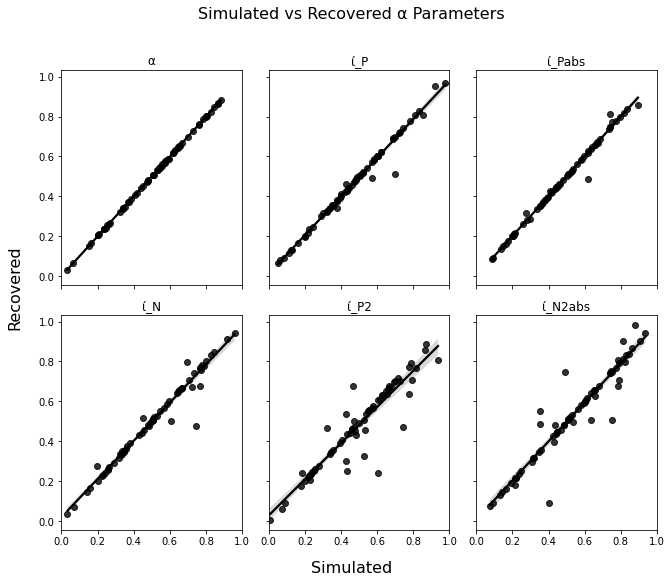

In [102]:
f, ax = plt.subplots(2, 3, sharex = True, sharey = True, figsize=(9, 7.5))
f.suptitle('Simulated vs Recovered α Parameters', y=1.02, fontsize = 16)
f.text(.5, -.02, 'Simulated', va='center', ha='center', fontsize = 16)
f.text(-.02, .5, 'Recovered', va='center', ha='center', fontsize = 16, rotation=90)

sns.regplot(α_subject_sim          , trace['α'         ].mean(axis=0), label='α_subject'        , ax=ax[0,0], color = 'black')
sns.regplot(iotaP_subject_sim      , trace['iotaP'     ].mean(axis=0), label='iotaP_subject'    , ax=ax[0,1], color = 'black')
sns.regplot(iotaPabs_subject_sim   , trace['iotaPabs'  ].mean(axis=0), label='iotaPabs_subject' , ax=ax[0,2], color = 'black')
sns.regplot(iotaN_subject_sim      , trace['iotaN'     ].mean(axis=0), label='iotaN_subject'    , ax=ax[1,0], color = 'black')
sns.regplot(iotaP2_subject_sim     , trace['iotaP2'    ].mean(axis=0), label='iotaP2_subject'   , ax=ax[1,1], color = 'black')
sns.regplot(iotaN2abs_subject_sim  , trace['iotaN2abs' ].mean(axis=0), label='iotaN2abs_subject', ax=ax[1,2], color = 'black')

for i in range(2):
    for j in range(3):
        ax[0,0].set_title('α')
        ax[0,1].set_title('ί_P')
        ax[0,2].set_title('ί_Pabs')
        ax[1,0].set_title('ί_N')
        ax[1,1].set_title('ί_P2')
        ax[1,2].set_title('ί_N2abs')


plt.setp(ax, xticks=[0, .2, .4, .6, .8, 1], yticks=[0, .2, .4, .6, .8, 1])        
plt.tight_layout()

plt.savefig(os.path.join('../output/',r'Exp2_OS2_Simulated_vs_Recovered.svg'), bbox_inches='tight')

# Fit the Model to Real Data

In [9]:
n_subjects = len(data['ID'].unique())

# Initial values
R = np.zeros((n_stim, n_subjects))  # Value estimate
overall_R = np.zeros((1, n_subjects))
v_excitatory = np.zeros((n_stim, n_subjects)) 
v_inhibitory = np.zeros((n_stim, n_subjects)) 
P = np.zeros((n_stim, n_subjects))
N = np.zeros((n_stim, n_subjects))
P2 = np.zeros((n_stim, n_subjects))
N2 = np.zeros((n_stim, n_subjects))

Phat = np.zeros((n_stim, n_subjects))
Nhat = np.zeros((n_stim, n_subjects))
Phat2 = np.zeros((n_stim, n_subjects))
Nhat2 = np.zeros((n_stim, n_subjects))

# US values
small_lambda = data.pivot(index='trialseq', values='US', columns='ID').values[:, np.newaxis, :].repeat(n_stim, axis=1)
stim_data = []

for sub in data['ID'].unique():
    stim_data.append(data.loc[data['ID'] == sub, ['Dcs', 'D1', 'D2', 'Ecs', 'E1', 'F', 'S', 'G', 'H', 'Mcs', 
                                                  'M1', 'N', 'Ucs', 'U1', 'U2', 'D1_abs', 'D2_abs', 'E1_abs', 
                                                  'M1_abs', 'U1_abs', 'U2_abs']].values)
    
stimuli_shown = np.dstack(stim_data)
big_lambda = small_lambda

# Add imaginary -1th trial
big_lambda = np.vstack([np.zeros((1, n_stim, n_subjects)), big_lambda[:-1, ...]])  # Add one trial of zeros to the start, remove the last trial
small_lambda = big_lambda
stimuli_shown = np.vstack([np.zeros((1, n_stim, n_subjects)), stimuli_shown]) # Add one trial of zeros to the start, DO NOT remove the last trial - this is needed for prediction

stimulus_type = np.ones(n_stim)
stimulus_type[[1, 4, 10, 13, 15, 17, 18, 19, 2, 14, 16, 20]] = 0 #make all OSs = 0

OS1_type = np.zeros(n_stim)
OS1_type[[1, 4, 10, 13, 15, 17, 18, 19]] = 1 #make 1st OSs = 1

OS2_type = np.zeros(n_stim)
OS2_type[[2, 14, 16, 20]] = 1 #make 2nd OSs = 1

# Convert task outcomes to tensors
big_lambda = T.as_tensor_variable(big_lambda)
small_lambda = T.as_tensor_variable(small_lambda)
stimuli_shown = T.as_tensor_variable(stimuli_shown)

with pm.Model() as model:
    
    # Learning rate lies between 0 and 1 so we use a beta distribution
    α_mean = pm.Normal('α_mean', 0.5, 10)
    α_sd = pm.HalfCauchy('α_sd', 10)

    iotaP_mean    = pm.Normal    ('iotaP_mean', 0.5, 10)
    iotaP_sd      = pm.HalfCauchy('iotaP_sd', 10)
    iotaPabs_mean = pm.Normal    ('iotaPabs_mean', 0.5, 10)
    iotaPabs_sd   = pm.HalfCauchy('iotaPabs_sd', 10)    
    iotaN_mean    = pm.Normal    ('iotaN_mean', 0.5, 10)
    iotaN_sd      = pm.HalfCauchy('iotaN_sd', 10)  
    iotaP2_mean    = pm.Normal    ('iotaP2_mean', 0.5, 10)
    iotaP2_sd      = pm.HalfCauchy('iotaP2_sd', 10)
    iotaN2abs_mean = pm.Normal    ('iotaN2abs_mean', 0.5, 10)
    iotaN2abs_sd   = pm.HalfCauchy('iotaN2abs_sd', 10)
    
    BoundedNormal = pm.Bound(pm.Normal, lower=0, upper=1)
    α_subject = BoundedNormal('α', mu=α_mean, sd=α_sd, shape=(n_subjects,))
    
    iotaP_subject        = BoundedNormal('iotaP'    ,    mu=iotaP_mean,    sd=iotaP_sd,    shape=(n_subjects,))
    iotaPabs_subject     = BoundedNormal('iotaPabs' ,    mu=iotaPabs_mean, sd=iotaPabs_sd, shape=(n_subjects,))
    iotaN_subject        = BoundedNormal('iotaN'    ,    mu=iotaN_mean,    sd=iotaN_sd,    shape=(n_subjects,))  
    iotaP2_subject       = BoundedNormal('iotaP2'   ,    mu=iotaP2_mean,    sd=iotaP2_sd,    shape=(n_subjects,))
    iotaN2abs_subject    = BoundedNormal('iotaN2abs',    mu=iotaN2abs_mean, sd=iotaN2abs_sd, shape=(n_subjects,))

    
    # Run the loop
    output, updates = scan(fn=learning_function,
                      sequences=[{'input': stimuli_shown[:-1, ...]},
                                {'input': big_lambda},
                                {'input': small_lambda},
                                {'input': training_or_test}],
                      outputs_info=[v_excitatory, v_inhibitory, P, N, P2, N2, Phat, Nhat, Phat2, Nhat2],
                      non_sequences=[stimulus_type, OS1_type, OS2_type, α_subject, 
                                     iotaP_subject, 
                                     iotaPabs_subject, 
                                     iotaN_subject, 
                                     iotaP2_subject, 
                                     iotaN2abs_subject
                                    ])

    # Get model output
    V, Vbar, P, N, P2, N2, Phat, Nhat, Phat2, Nhat2 = output
    
    # # Single R value
    estimated_overall_R = ((V * stimuli_shown[1:, ...]).sum(axis=1) - (Vbar * stimuli_shown[1:, ...]).sum(axis=1)) + \
        ((P * stimuli_shown[1:, ...]).sum(axis=1) * (Phat * stimuli_shown[1:, ...]).sum(axis=1) * (Vbar * stimuli_shown[1:, ...]).sum(axis=1)) - \
        ((N * stimuli_shown[1:, ...]).sum(axis=1) * (Nhat * stimuli_shown[1:, ...]).sum(axis=1) * (V * stimuli_shown[1:, ...]).sum(axis=1)) + \
        ((P2 * stimuli_shown[1:, ...]).sum(axis=1) * (Nhat * stimuli_shown[1:, ...]).sum(axis=1) * (Phat2 * stimuli_shown[1:, ...]).sum(axis=1) * (N * stimuli_shown[1:, ...]).sum(axis=1) * (V * stimuli_shown[1:, ...]).sum(axis=1)) - \
        ((N2 * stimuli_shown[1:, ...]).sum(axis=1) * (Phat * stimuli_shown[1:, ...]).sum(axis=1) * (Nhat2 * stimuli_shown[1:, ...]).sum(axis=1) * (P * stimuli_shown[1:, ...]).sum(axis=1) * (Vbar * stimuli_shown[1:, ...]).sum(axis=1))
       
    # This allows us to output the estimated R
    estimated_overall_R = pm.Deterministic('estimated_overall_R', estimated_overall_R)
    V = pm.Deterministic('estimated_V', V)
    Vbar = pm.Deterministic('estimated_Vbar', Vbar)
    P = pm.Deterministic('estimated_P', P)
    N = pm.Deterministic('estimated_N', N)
    P2 = pm.Deterministic('estimated_P2', P2)
    N2 = pm.Deterministic('estimated_N2', N2)
    γ1 = pm.Deterministic('estimated_γ1', V*Vbar)
    γ2 = pm.Deterministic('estimated_γ2', P*N)
    
    Phat = pm.Deterministic('estimated_Phat', Phat)
    Nhat = pm.Deterministic('estimated_Nhat', Nhat)
    Phat2 = pm.Deterministic('estimated_Phat2', Phat2)
    Nhat2 = pm.Deterministic('estimated_Nhat2', Nhat2)
          
    # Reshape output of the model and get categorical likelihood
    sigma = pm.HalfCauchy('sigma', 0.5)
    likelihood = pm.Normal('likelihood', mu=estimated_overall_R, sigma=sigma, observed=pd.DataFrame(observed_R.squeeze()))

#### Variational Inference

In [10]:
from pymc3.variational.callbacks import CheckParametersConvergence
with model:
    approx = pm.fit(method='advi', n=25000, callbacks=[CheckParametersConvergence()])

Finished [100%]: Average Loss = 20,257


In [11]:
trace = approx.sample(1000)

In [78]:
#Saves model results; optional
with open('Exp2_OS2.pkl', 'wb') as f:
    pickle.dump(trace, f)

In [ ]:
#Loads model results; optional
trace = pickle.load(open('Exp2_OS2.pkl', 'rb'))

In [12]:
parameter_output = pm.summary(trace, kind='stats', var_names=[i for i in model.named_vars if 'α' in i and not i in model.deterministics and not 'log' in i and not 'interval' in i
                                                         or 'iota' in i and not i in model.deterministics and not 'log' in i and not 'interval' in i])

# Model Output

In [80]:
overall_R_mean = trace['estimated_overall_R'].mean(axis=0)
overall_R_sd = trace['estimated_overall_R'].std(axis=0)
sub_ids = data['ID'].unique()
subs = [np.where(data['ID'].unique() == sub)[0][0] for sub in sub_ids]

In [81]:
waic_output = pm.waic(trace)

C:\Users\tzboz\anaconda3\lib\site-packages\arviz\stats\stats.py:1194: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


In [82]:
waic_output

Computed from 1000 by 22981 log-likelihood matrix

        Estimate       SE
IC_waic 39843.11   289.08
p_waic    397.81        -

There has been a warning during the calculation. Please check the results.

In [83]:
parameter_output.to_csv(os.path.join('../output/',r'Exp2_OS2_Parameters.csv'))
waic_output.to_csv(os.path.join('../output/',r'Exp2_OS2_WAIC.csv'))

In [84]:
from sklearn.metrics import r2_score
r2s = []
for n, sub in enumerate(data['ID'].unique()):
    r2s.append(r2_score(observed_R.squeeze()[:, n], overall_R_mean[:, n]))
roup_r2 = np.median(r2s)
print(group_r2)

0.5602275931813666


In [85]:
r2s = {'R2': [r2s]}
r2s = pd.DataFrame(r2s)
r2s.to_csv(os.path.join('../output/',r'Exp2_OS2_R2.csv'))

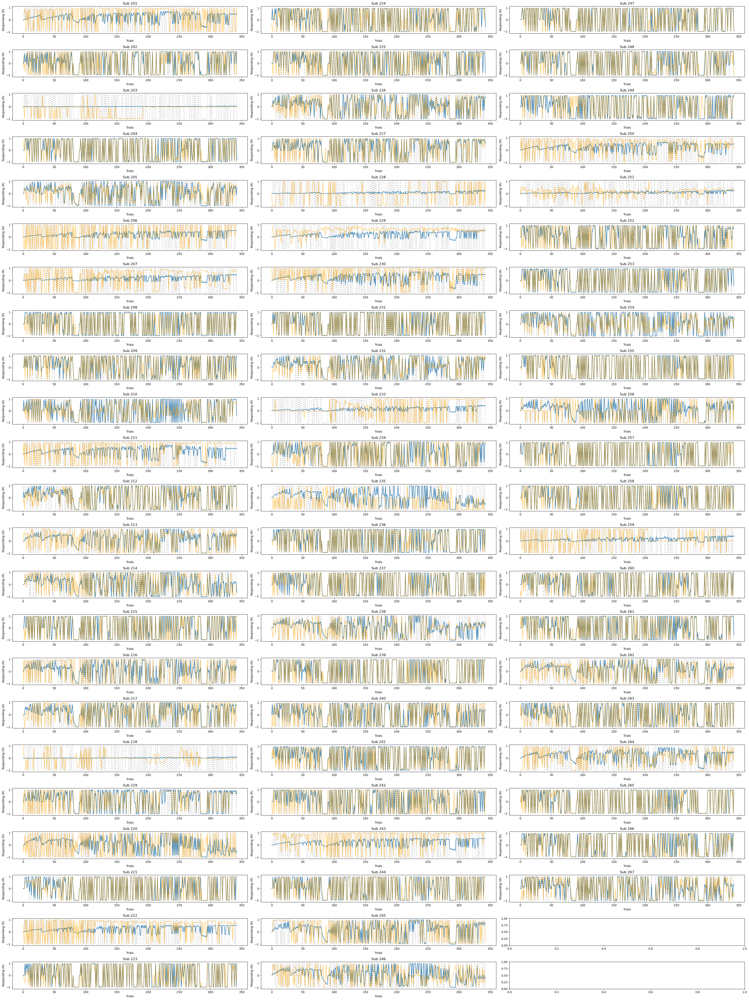

In [89]:
f, ax = plt.subplots(23, 3, figsize=(36, 48), dpi = 100)

overall_R_mean = trace['estimated_overall_R'].mean(axis=0)
overall_R_sd = trace['estimated_overall_R'].std(axis=0)

sub_ids = data['ID'].unique()

subs = [np.where(data['ID'].unique() == sub)[0][0] for sub in sub_ids]
    

for n, sub in enumerate(subs):
    ax[n % 23, int(n / 23)].fill_between(range(overall_R_mean.shape[0]), overall_R_mean[:, sub] - overall_R_sd[:, sub], overall_R_mean[:, sub] + overall_R_sd[:, sub], alpha=0.3)
    ax[n % 23, int(n / 23)].plot(overall_R_mean[:, sub], alpha = .9)
    ax[n % 23, int(n / 23)].plot(observed_R.squeeze()[:, sub], color='orange', linestyle='-', alpha = .6)#participant's real data
    ax[n % 23, int(n / 23)].plot(overall_R_sim.squeeze()[:, sub], color='black', linestyle=(0, (1, 3)), alpha = .35, linewidth = 1.75)#Alpha = 1; this is the correct answer if a person learned perfectly
    if n == 0:
        ax[n % 23, int(n / 23)].set_ylabel('Mean (+/-SD) overall R')
    ax[n % 23, int(n / 23)].set_ylabel('Responding (R)')
    ax[n % 23, int(n / 23)].set_xlabel('Trials')
    ax[n % 23, int(n / 23)].set_title('Sub {0}'.format(sub_ids[n]))   

plt.tight_layout()
plt.savefig(os.path.join('../output/',r'Exp2_OS2_Individual_Real_and_Estimated_Responding.svg'), bbox_inches='tight')

In [ ]:
%load_ext watermark
%watermark -v -p pytest,jupyterlab,numpy,pandas,theano,pymc3